# Double pendulum simulations: Lagrangian

Solving double pendulum with Lagrangian formulations.

Ximing Yuan(yuan.761@osu.edu)

## Euler-Lagrange equation

For a simple pendulum, the Lagrangian with generalized coordinate $\theta$ is

$\begin{align}
  \mathcal{L} = \frac12 m L^2 \dot\theta^2 - mgL(1 - \cos\theta)
\end{align}$

The Euler-Lagrange equation is

$\begin{align}
 \frac{d}{dt}\frac{\partial\mathcal{L}}{\partial \dot\theta} = \frac{\partial\mathcal L}{\partial\theta}
 \quad\Longrightarrow\quad
 m L^2 \ddot \theta = -mgL\sin\theta
  \ \mbox{or}\ \ddot\theta = - \omega_0^2\sin\theta = 0
  \;.
\end{align}$

For double pendulum
$\begin{align}
  \mathcal{L} = T - U = \frac12 (m_1 + m_2) L_1^2 \dot\theta_1^2 + m_2 L_1 L_2 \dot\theta_1 \dot\theta_2 \cos(\theta_1 - \theta_2) + \frac12 m_2 L_2^2 \dot\theta_2^2 - (m_1 + m_2) g L_1 (1 - \cos\theta_1)- m_2gL_2(1 - \cos\theta_2)
\end{align}$

The Euler-Lagrange equations (after some rearranging and simplifying) are

$\begin{align}
 \frac{d}{dt}\frac{\partial\mathcal{L}}{\partial \dot\theta_1} = \frac{\partial\mathcal L}{\partial\theta_1}
 \quad\Longrightarrow\quad
 (m_1 + m_2) L_1 \ddot \theta_1 + m_2 L_2 \cos(\theta_1 - \theta_2) \ddot\theta_2 = -(m_1 + m_2) g \sin\theta_1 - m_2 L_2 \dot\theta_2^2\sin(\theta_1 - \theta_2)
\end{align}$

$\begin{align}
 \frac{d}{dt}\frac{\partial\mathcal{L}}{\partial\dot\theta_2} = \frac{\partial\mathcal L}{\partial\theta_2}
 \quad\Longrightarrow\quad
 m_2 L_1 \cos(\theta_1-\theta_2)\ddot \theta_1 + m_2 L_2 \ddot\theta_2 = - m_2 g \sin\theta_2 + m_2 L_1 \dot\theta_1^2\sin(\theta_1-\theta_2)
\end{align}$

Then solve the equations

$
(m_1 + m_2)L_1 \ddot{\theta}_1 + m_2L_2\ddot{\theta}_2 \cos (\theta_1 - \theta_2) + m_2L_2\dot{\theta}_2^2\sin(\theta_1 - \theta_2) + (m_1 + m_2)g\sin\theta_1 = 0 \qquad 
$
$
m_2L_2\ddot{\theta}_2 + m_2L_1\ddot{\theta}_1\cos(\theta_1-\theta_2) - m_2L_1\dot{\theta}_1^2\sin(\theta_1-\theta_2) + m_2g\sin\theta_2 = 0 \qquad\qquad\qquad\quad \
$

Introduce ${z}_i=\dot\theta_i\to\dot{z}_i=\ddot\theta$, since solve_ivp needs to work for first derivative equations

$
\dot{z}_1 = \big(L_1(m_1 + m_2 \sin^2(\theta_1 - \theta_2))\big)^{-1}\big(m_2g\sin\theta_2\cos(\theta_1-\theta_2) - m_2\sin(\theta_1-\theta_2)(L_1z_1^2\cos(\theta_1 - \theta_2) + L_2z_2^2)-(m_1+m_2)g\sin\theta_1\big)
$
$
\dot{z}_2 = \big(L_2(m_1 + m_2 \sin^2(\theta_1-\theta_2))\big)^{-1} \big((m_1+m_2)(L_1z_1^2\sin(\theta_1-\theta_2) + g(\sin\theta_1\cos(\theta_1-\theta_2) - \sin\theta_2))+m_2L_2z_2^2\sin(\theta_1-\theta_2)\cos(\theta_1-\theta_2)\big)
$


In [2]:
%matplotlib inline

In [3]:
import numpy as np
from scipy.integrate import odeint, solve_ivp

import matplotlib.pyplot as plt
from IPython.display import Image

In [4]:
Image(url='https://upload.wikimedia.org/wikipedia/commons/7/78/Double-Pendulum.svg')

In [5]:
# The dpi (dots-per-inch) setting will affect the resolution and how large
#  the plots appear on screen and printed.  So you may want/need to adjust 
#  the figsize when creating the figure.
plt.rcParams['figure.dpi'] = 100.    # this is the default for notebook

# Change the common font size (smaller when higher dpi)
font_size = 12
plt.rcParams.update({'font.size': font_size})

## Pendulum class and utility functions

In [6]:
class DoublePendulum():
    """
    Pendulum class implements the parameters and Lagrange's equations for 
     a simple pendulum (no driving or damping).
     
    Parameters
    ----------
    L1: float
        length of the first pendulum
    L2: float
        length of the second pendulum
    g : float
        gravitational acceleration at the earth's surface
    mn : float
        mass of pendulum bob, where n is the pendulum bob number

    Methods
    -------
    dy_dt(t, y)
        Returns the right side of the differential equation in vector y, 
        given time t and the corresponding value of y.
    """
    def __init__(self, L1=1., L2=1., mass1=1., mass2=1., g=1.
                ):
        self.L1 = L1
        self.L2 = L2
        self.g = g
        self.m1 = mass1
        self.m2 = mass2
    
    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq: 
        [dphi/dt d^2phi/dt^2]
        
        Parameters
        ----------
        t : float
            time 
        y : float
            A 4-component vector with
            y[0] = theta1 and y[1] = theta2_dot
            y[2] = theta2 and y[3] = theta2_dot
            
        Returns
        -------
        
        """
        theta1, z1, theta2, z2 = y
        c, s = np.cos(theta1 - theta2), np.sin(theta1 - theta2)
        denom = (self.m1 +self.m2 * s**2)
        
        theta1_dot = z1
        z1_dot = ( self.m2 * self.g * np.sin(theta2) * c\
                    - self.m2 * s * (self.L1 * z1**2 *c + self.L2 * z2**2) \
                    - (self.m1 +self.m2) * self.g *np.sin(theta1) ) \
                    / self.L1 / denom
        theta2_dot = z2
        z2_dot = ( (self.m1 +self.m2) * (self.L1 * z1**2 * s \
                    - self.g * np.sin(theta2) + self.g * np.sin(theta1) * c)
                    + self.m2 *self.L2 * z2**2 * s * c ) \
                    / self.L2 / denom
        return theta1_dot, z1_dot, theta2_dot, z2_dot
    
    def solve_ode(self, t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0, 
                  abserr=1.0e-9, relerr=1.0e-9):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        """
        y = [theta1_0, theta1_dot_0, theta2_0, theta2_dot_0]
        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y, t_eval=t_pts, 
                             atol=abserr, rtol=relerr)
        theta1, theta1_dot, theta2, theta2_dot = solution.y

        return theta1, theta1_dot, theta2, theta2_dot
    
    def calc_E(y):
        """Return the total energy"""
        
        th1, th1d, th2, th2d = y.T
        V = -(m1+m2)*L1*g*mnp.cos(th1)-m2*L2*g*np.cos(th2)
        T = 0.5*m1*(L1*th1d)**2 +0.5*m2*((L1*th1d)**2 + (L2*th2d)**2 +
                2*L1*L2*th1d*th2d*np.cos(th1-th2))
        return T + V

In [7]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [8]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

## Make simple pendulum plots 

In [24]:
# Labels for individual plot axes
theta_vs_time_labels = (r'$t$', r'$\theta(t)$')


# Common plotting time (generate the full time then use slices)
t_start = 0.
t_end = 100.
delta_t = 0.05

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

L1 = 2.
L2 = 1.
g = 1.
mass1 = 1.
mass2 = 1.

# Instantiate a pendulum 
dp1 = DoublePendulum(L1=L1, L2=L2, g=g, mass1=mass1, mass2=mass2)


## First Graph

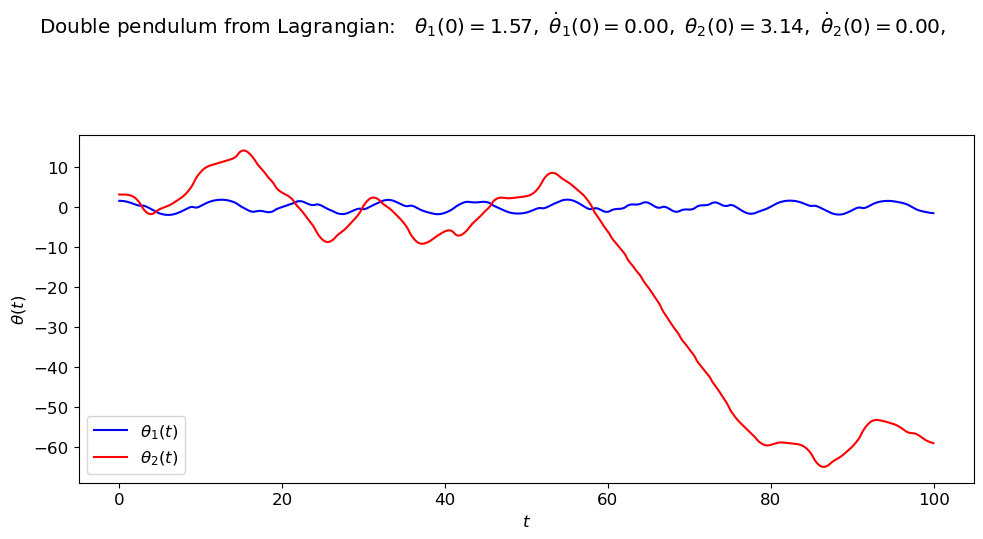

In [25]:
# Choose initial conditions
theta1_0 = np.pi/2
theta1_dot_0 = 0.
theta2_0 = np.pi
theta2_dot_0 = 0.

theta1, theta1_dot, theta2, theta2_dot = \
    dp1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0)

# start the plot!
fig = plt.figure(figsize=(10,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf' $\theta_1(0) = {theta1_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {theta1_dot_0:.2f},$' + \
                rf' $\theta_2(0) = {theta2_0:.2f},$' + \
                rf' $\dot\theta_2(0) = {theta2_dot_0:.2f},$' + \
                '\n'     # \n means a new line (adds some space here)
fig.suptitle(overall_title, va='baseline')
    
# first plot: phi plot 
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], theta1[start : stop], 
            axis_labels=theta_vs_time_labels, 
            color='blue',
            label=r'$\theta_1(t)$',  
            ax=ax_a)   
plot_y_vs_x(t_pts[start : stop], theta2[start : stop], 
            axis_labels=theta_vs_time_labels, 
            color='red',
            label=r'$\theta_2(t)$',  
            ax=ax_a) 
                              
fig.tight_layout()
fig.savefig('double_pendulum_Lagrange_1.png', bbox_inches='tight')  

## Second Graph
graph with different initial condition

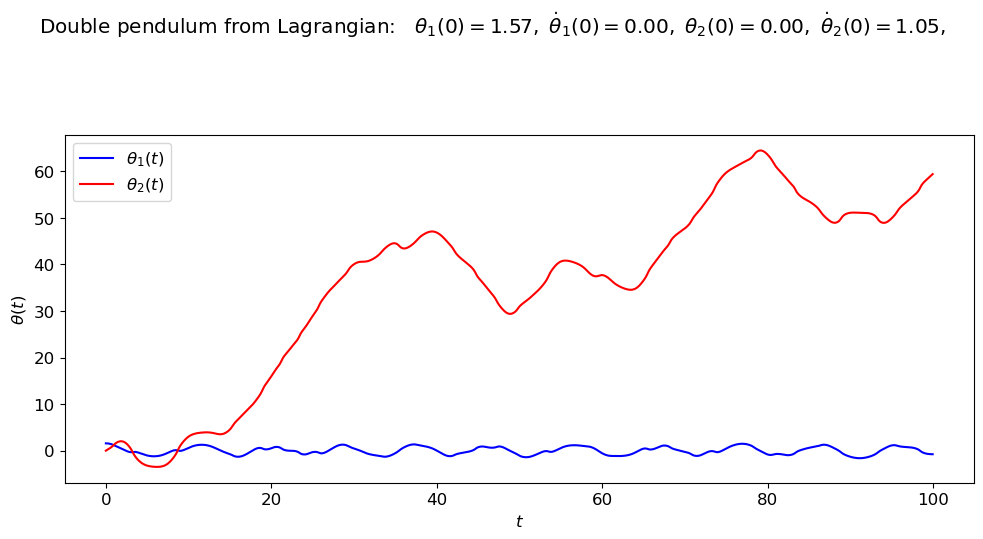

In [26]:
# Use a different Initial condition
theta1_0 = np.pi/2
theta1_dot_0 = 0.
theta2_0 = 0
theta2_dot_0 = np.pi / 3.

theta1, theta1_dot, theta2, theta2_dot = \
    dp1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0)

# start the plot!
fig = plt.figure(figsize=(10,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf' $\theta_1(0) = {theta1_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {theta1_dot_0:.2f},$' + \
                rf' $\theta_2(0) = {theta2_0:.2f},$' + \
                rf' $\dot\theta_2(0) = {theta2_dot_0:.2f},$' + \
                '\n'     # \n means a new line (adds some space here)
fig.suptitle(overall_title, va='baseline')
    
# first plot: phi plot 
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], theta1[start : stop], 
            axis_labels=theta_vs_time_labels, 
            color='blue',
            label=r'$\theta_1(t)$',  
            ax=ax_a)   
plot_y_vs_x(t_pts[start : stop], theta2[start : stop], 
            axis_labels=theta_vs_time_labels, 
            color='red',
            label=r'$\theta_2(t)$',  
            ax=ax_a) 
                              
fig.tight_layout()
fig.savefig('double_pendulum_Lagrange_1.png', bbox_inches='tight')  

## $\Delta\theta$ Graph

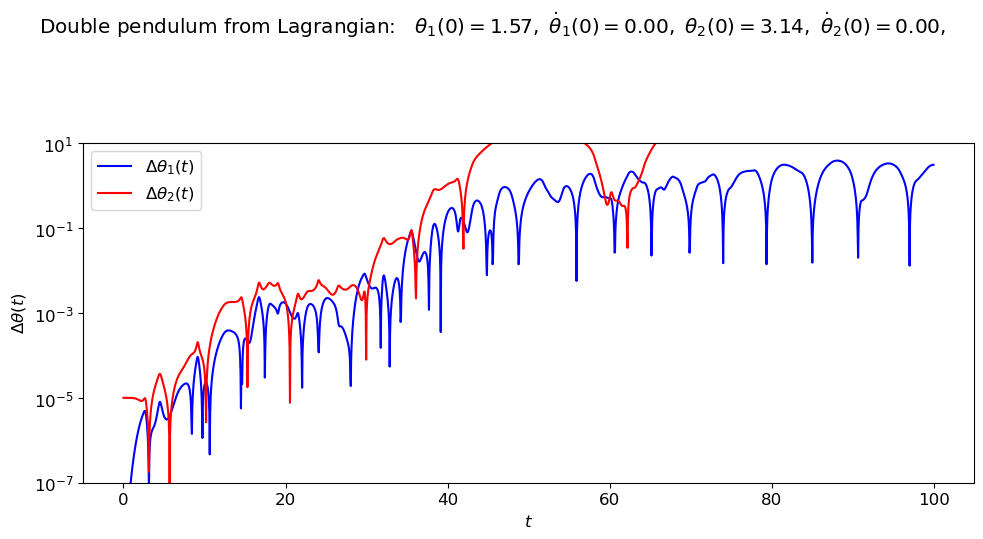

In [27]:
# both plots: same initial conditions
theta1_0 = np.pi/2
theta1_dot_0 = 0.
theta2_0 = np.pi
theta2_dot_0 = 0.

theta1, theta1_dot, theta2, theta2_dot = \
    dp1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0)
theta1b, theta1b_dot, theta2b, theta2b_dot = \
    dp1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0-0.00001, theta2_dot_0)

delta_theta_vs_time_labels = (r'$t$', r'$\Delta\theta(t)$')

# start the plot!
fig = plt.figure(figsize=(10,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf' $\theta_1(0) = {theta1_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {theta1_dot_0:.2f},$' + \
                rf' $\theta_2(0) = {theta2_0:.2f},$' + \
                rf' $\dot\theta_2(0) = {theta2_dot_0:.2f},$' + \
                '\n'     # \n means a new line (adds some space here)
fig.suptitle(overall_title, va='baseline')
    
# first plot: phi plot 
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], np.abs(theta1[start : stop]-theta1b[start : stop]), 
            axis_labels=delta_theta_vs_time_labels, 
            color='blue', semilogy=True,
            label=r'$\Delta\theta_1(t)$',  
            ax=ax_a)   
plot_y_vs_x(t_pts[start : stop], np.abs(theta2[start : stop]-theta2b[start : stop]), 
            axis_labels=delta_theta_vs_time_labels, 
            color='red', semilogy=True,
            label=r'$\Delta\theta_2(t)$',  
            ax=ax_a) 
ax_a.set_ylim(1.e-7,10.)
                              
fig.tight_layout()
fig.savefig('double_pendulum_Lagrange_2.png', bbox_inches='tight')  

The Red and Blue graph shows the value of $\Delta\theta_i$ with slightly different initial condition, see the value was close initially, the value is increasing linearly in a expontional graph, this means the value if extremely sensitive to initial conditions, which is a characteristic of **chaotic motion**.  

## Animation

In [28]:
from matplotlib import animation, rc
from IPython.display import HTML

In [29]:
def xy_coords(x0, y0, theta, L):
    """
    Convert angle theta and pendulum length L to the bob position with 
    respect to (x0, y0).
    """
    x = x0 + L * np.sin(theta)
    y = y0 - L * np.cos(theta)
    return x, y

In [30]:
%%capture
x_min = -3.2
x_max = -x_min
y_min = -3.2
y_max = -y_min

fig_anim = plt.figure(figsize=(5, 5), num='Double Pendulum')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)

# By assigning the first return from plot to pt1_anim and the others,
# we can later change the values.
x0, y0 = 0., 0.
pt0_anim, = ax_anim.plot(x0, y0, 'o', markersize=6,
                        color='black')

x1, y1 = xy_coords(x0, y0, theta1[0], dp1.L1)
pt1_anim, = ax_anim.plot(x1, y1,
                         'o', markersize=12,
                         color='blue')
ln1_anim, = ax_anim.plot([x0, x1], [y0, y1], color='blue', lw=3)
x2, y2 = xy_coords(x1, y1, theta2[0], dp1.L2)
pt2_anim, = ax_anim.plot(x2, y2,
                         'o', markersize=12,
                         color='blue')
ln2_anim, = ax_anim.plot([x1, x2], [y1, y2], color='blue', lw=3)

x1b, y1b = xy_coords(x0, y0, theta1b[0], dp1.L1)
pt1b_anim, = ax_anim.plot(x1b, y1b,
                         'o', markersize=12,
                         color='red')
ln1b_anim, = ax_anim.plot([x0, x1b], [y0, y1b], color='red', lw=3)
x2b, y2b = xy_coords(x1b, y1b, theta2b[0], dp1.L2)
pt2b_anim, = ax_anim.plot(x2b, y2b,
                         'o', markersize=12,
                         color='red')
ln2b_anim, = ax_anim.plot([x1b, x2b], [y1b, y2b], color='red', lw=3)


ax_anim.set_aspect(1)
ax_anim.axis('off')
fig_anim.tight_layout()

In [31]:
def animate_pendulum(i):
    """
    This is the function called by FuncAnimation to create each frame,
    numbered by i. So each i corresponds to a point in the t_pts
    array, with index i.
    """
    
    i_skip = 2 * i
    
    x0, y0 = 0., 0.
    pt0_anim.set_data(x0, y0)
    
    x1, y1 = xy_coords(x0, y0, theta1[i_skip], dp1.L1)
    pt1_anim.set_data(x1, y1)
    ln1_anim.set_data([x0, x1], [y0, y1])
    x2, y2 = xy_coords(x1, y1, theta2[i_skip], dp1.L2)
    pt2_anim.set_data(x2, y2)
    ln2_anim.set_data([x1, x2], [y1, y2])
    
    x1b, y1b = xy_coords(x0, y0, theta1b[i_skip], dp1.L1)
    pt1b_anim.set_data(x1b, y1b)
    ln1b_anim.set_data([x0, x1b], [y0, y1b])
    x2b, y2b = xy_coords(x1b, y1b, theta2b[i_skip], dp1.L2)
    pt2b_anim.set_data(x2b, y2b)
    ln2b_anim.set_data([x1b, x2b], [y1b, y2b])
    
    return (pt0_anim, pt1_anim, ln1_anim, pt2_anim, ln2_anim,
            pt1b_anim, ln1b_anim, pt2b_anim, ln2b_anim)
    

In [32]:
frame_interval = 20. # time between frames
frame_number = 1001 # number of frames to include (index of t_pts)
anim =animation.FuncAnimation(fig_anim,
                              animate_pendulum,
                              init_func=None,
                              frames=frame_number,
                              interval=frame_interval,
                              blit=True,
                              repeat=False)


In [33]:
HTML(anim.to_jshtml()) #animate